In [13]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [14]:
# Settings
pd.set_option("display.max_columns", None)

# Load dataset
df = pd.read_csv("/Users/mac/Fraud Detection/data/creditcard.csv")
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [15]:
print(df.shape)
print(df.info())
print(df.isnull().sum())
print(df.duplicated().sum())
df.describe().T


(284807, 31)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 2

,count,mean,std,min,25%,50%,75%,max
Time,284807.0,9.481386e+04,47488.145955,0.000000,54201.500000,84692.000000,139320.500000,172792.000000
V1,284807.0,1.168375e-15,1.958696,-56.407510,-0.920373,0.018109,1.315642,2.454930
V2,284807.0,3.416908e-16,1.651309,-72.715728,-0.598550,0.065486,0.803724,22.057729
V3,284807.0,-1.379537e-15,1.516255,-48.325589,-0.890365,0.179846,1.027196,9.382558
V4,284807.0,2.074095e-15,1.415869,-5.683171,-0.848640,-0.019847,0.743341,16.875344
V5,284807.0,9.604066e-16,1.380247,-113.743307,-0.691597,-0.054336,0.611926,34.801666
V6,284807.0,1.487313e-15,1.332271,-26.160506,-0.768296,-0.274187,0.398565,73.301626
V7,284807.0,-5.556467e-16,1.237094,-43.557242,-0.554076,0.040103,0.570436,120.589494
V8,284807.0,1.213481e-16,1.194353,-73.216718,-0.208630,0.022358,0.327346,20.007208
V9,284807.0,-2.406331e-15,1.098632,-13.434066,-0.643098,-0.051429,0.597139,15.594995


Class
0    99.827251
1     0.172749
Name: proportion, dtype: float64


([<matplotlib.patches.Wedge at 0x12d2fecc0>,
 [Text(-0.0059695296484177296, -1.0999838020242738, 'Non-Fraud'),
  Text(0.005969695741350842, 1.0999838011228873, 'Fraud')],
 [Text(-0.0032561070809551253, -0.599991164740513, '99.8%'),
  Text(0.003256197677100459, 0.5999911642488476, '0.2%')])

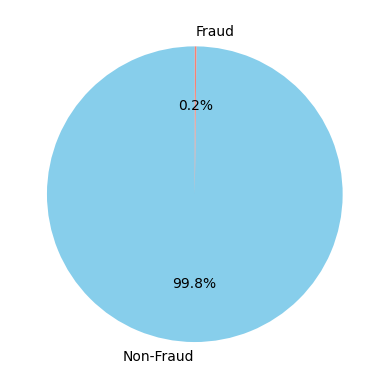

In [16]:
# Target variable distribution
fraud_counts = df['Class'].value_counts(normalize=True) * 100
print(fraud_counts)

# Plot imbalance
plt.pie(fraud_counts, labels=['Non-Fraud', 'Fraud'], autopct='%1.1f%%', startangle=90, colors=['skyblue', 'salmon'])       



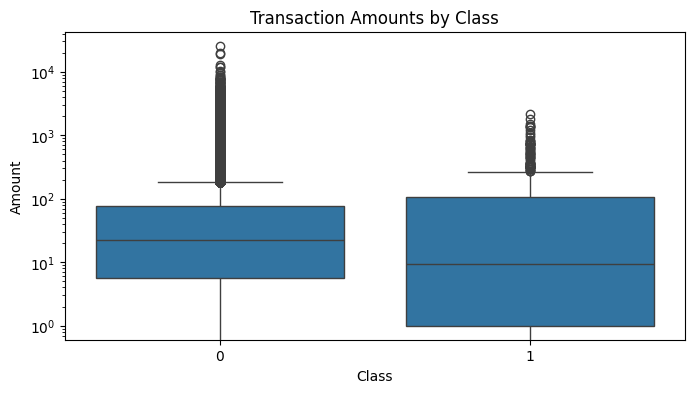

In [17]:
plt.figure(figsize=(8,4))
sns.boxplot(x="Class", y="Amount", data=df)
plt.title("Transaction Amounts by Class")
plt.yscale("log")  # fraud amounts tend to be smaller
plt.show()

px.histogram(df, x="Amount", color="Class", nbins=50, barmode="overlay")

fig = px.histogram(
    df, x="Amount", color="Class", nbins=50,
    barmode="overlay", marginal="box",
    title="Transaction Amount Distribution (Fraud vs Non-Fraud)",
    log_y=True
)
fig.show()

fig = px.box(
    df, 
    x="Class", 
    y="Amount", 
    color="Class", 
    points="all",  # show individual points (can use 'outliers' if too dense)
    title="Transaction Amounts by Fraud vs Non-Fraud",
    log_y=True  # log scale to handle extreme values
)
fig.show()




In [18]:
fig = px.histogram(
    df, x="Time", color="Class",
    nbins=100, barmode="overlay",
    title="Fraud vs Non-Fraud Over Time"
)
fig.show()


In [19]:
corr = df.corr()["Class"].sort_values(ascending=False)

fig = px.bar(
    corr[1:21],  # skip "Class" itself, take top 20 features
    x=corr[1:21].index, y=corr[1:21].values,
    title="Top 20 Feature Correlations with Fraud Class"
)
fig.show()


In [20]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, RobustScaler
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# Copy dataset to avoid touching original
df_prep = df.copy()


In [21]:
# Initialize scaler robust"
scaler = RobustScaler()

df_prep[["Amount", "Time"]] = scaler.fit_transform(df_prep[["Amount", "Time"]])
df_prep.head()


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-0.994983,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,1.783274,0
1,-0.994983,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,-0.269825,0
2,-0.994972,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,4.983721,0
3,-0.994972,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,1.418291,0
4,-0.994960,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,0.670579,0


In [22]:
# Stratified split into train and test sets
X = df_prep.drop("Class", axis=1)
y = df_prep["Class"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

print("Training set:", X_train.shape, "Frauds:", sum(y_train))
print("Test set:", X_test.shape, "Frauds:", sum(y_test))

# Handle class imbalance with SMOTE + RandomUnderSampler

# Baseline
X_train_base, y_train_base = X_train, y_train

# SMOTE Oversampling
sm = SMOTE(random_state=42)
X_train_smote, y_train_smote = sm.fit_resample(X_train, y_train)

print("Before SMOTE:", y_train.value_counts())
print("After SMOTE:", y_train_smote.value_counts())

# Random Undersampling
rus = RandomUnderSampler(random_state=42)
X_train_rus, y_train_rus = rus.fit_resample(X_train, y_train)

print("Before Random Undersampling:", y_train.value_counts())
print("After Random Undersampling:", y_train_rus.value_counts())



Training set: (227845, 30) Frauds: 394
Test set: (56962, 30) Frauds: 98
Before SMOTE: Class
0    227451
1       394
Name: count, dtype: int64
After SMOTE: Class
0    227451
1    227451
Name: count, dtype: int64
Before Random Undersampling: Class
0    227451
1       394
Name: count, dtype: int64
After Random Undersampling: Class
0    394
1    394
Name: count, dtype: int64


### Baseline Modeling

In [24]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

from sklearn.metrics import (
    classification_report, confusion_matrix, roc_auc_score, average_precision_score
)
import plotly.figure_factory as ff
import numpy as np


In [25]:
def evaluate_model(model, X_test, y_test, model_name="Model"):
    """Evaluate model with key metrics and confusion matrix"""

    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]  # probability of fraud (class=1)

    # Metrics
    roc_auc = roc_auc_score(y_test, y_prob)
    pr_auc = average_precision_score(y_test, y_prob)

    print(f"\n🔹 {model_name}")
    print(classification_report(y_test, y_pred, digits=4))
    print(f"ROC-AUC: {roc_auc:.4f} | PR-AUC: {pr_auc:.4f}")

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    cm_labels = ["Non-Fraud", "Fraud"]
    fig = ff.create_annotated_heatmap(
        z=cm,
        x=cm_labels, y=cm_labels,
        colorscale="Blues", showscale=True
    )
    fig.update_layout(title=f"Confusion Matrix - {model_name}")
    fig.show()

    return {"model": model_name, "roc_auc": roc_auc, "pr_auc": pr_auc}


In [ ]:
# Logistic Regression
lr = LogisticRegression(max_iter=1000, solver="liblinear", random_state=42)
lr.fit(X_train_base, y_train_base)

results = []
results.append(evaluate_model(lr, X_test, y_test, "Logistic Regression (Baseline)"))


lr_w = LogisticRegression(max_iter=1000, solver="liblinear", class_weight="balanced", random_state=42)
lr_w.fit(X_train_base, y_train_base)

results.append(evaluate_model(lr_w, X_test, y_test, "Logistic Regression (Class Weights)"))



🔹 Logistic Regression (Baseline)
              precision    recall  f1-score   support

           0     0.9994    0.9998    0.9996     56864
           1     0.8289    0.6429    0.7241        98

    accuracy                         0.9992     56962
   macro avg     0.9142    0.8213    0.8619     56962
weighted avg     0.9991    0.9992    0.9991     56962

ROC-AUC: 0.9576 | PR-AUC: 0.7455



🔹 Logistic Regression (Class Weights)
              precision    recall  f1-score   support

           0     0.9999    0.9756    0.9876     56864
           1     0.0610    0.9184    0.1144        98

    accuracy                         0.9755     56962
   macro avg     0.5304    0.9470    0.5510     56962
weighted avg     0.9982    0.9755    0.9861     56962

ROC-AUC: 0.9721 | PR-AUC: 0.7189


In [27]:
# Random Forest 
rf = RandomForestClassifier(
    n_estimators=200, random_state=42, class_weight="balanced_subsample", n_jobs=-1
)
rf.fit(X_train_base, y_train_base)

results.append(evaluate_model(rf, X_test, y_test, "Random Forest"))



🔹 Random Forest
              precision    recall  f1-score   support

           0     0.9996    0.9999    0.9998     56864
           1     0.9605    0.7449    0.8391        98

    accuracy                         0.9995     56962
   macro avg     0.9800    0.8724    0.9194     56962
weighted avg     0.9995    0.9995    0.9995     56962

ROC-AUC: 0.9471 | PR-AUC: 0.8583


In [28]:
#  XGBoost
xgb = XGBClassifier(
    n_estimators=300, max_depth=5, learning_rate=0.1,
    subsample=0.8, colsample_bytree=0.8,
    scale_pos_weight=(len(y_train_base)-sum(y_train_base))/sum(y_train_base),  # handle imbalance
    eval_metric="logloss", random_state=42, use_label_encoder=False
)
xgb.fit(X_train_base, y_train_base)

results.append(evaluate_model(xgb, X_test, y_test, "XGBoost"))



/Users/mac/Fraud Detection/venv/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning:

[07:26:54] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.





🔹 XGBoost
              precision    recall  f1-score   support

           0     0.9997    0.9998    0.9998     56864
           1     0.8817    0.8367    0.8586        98

    accuracy                         0.9995     56962
   macro avg     0.9407    0.9183    0.9292     56962
weighted avg     0.9995    0.9995    0.9995     56962

ROC-AUC: 0.9790 | PR-AUC: 0.8768


In [ ]:
# LightGBM
lgbm = LGBMClassifier(
    n_estimators=300, max_depth=5, learning_rate=0.1,
    subsample=0.8, colsample_bytree=0.8,
    scale_pos_weight=(len(y_train_base)-sum(y_train_base))/sum(y_train_base),  # handle imbalance
    eval_metric="logloss", random_state=42, use_label_encoder=False
)
lgbm.fit(X_train_base, y_train_base)

results.append(evaluate_model(lgbm, X_test, y_test, "LightGBM"))


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Number of positive: 394, number of negative: 227451
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.051174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 227845, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

In [30]:
results_df = pd.DataFrame(results)
fig = px.bar(
    results_df, x="model", y=["roc_auc", "pr_auc"],
    barmode="group", title="Baseline Model Comparison (ROC-AUC vs PR-AUC)"
)
fig.show()

results_df


,model,roc_auc,pr_auc
0,Logistic Regression (Baseline),0.957574,0.745493
1,Logistic Regression (Class Weights),0.972100,0.718940
2,Random Forest,0.947053,0.858255
3,XGBoost,0.979015,0.876806
4,LightGBM,0.978595,0.829641


### Advanced Modeling

In [ ]:
# Logistic Regression with Smote